In [12]:
# imports
import numpy as np
import joblib
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score, recall_score
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as plt
from sklearn.model_selection import cross_validate
import pandas as pd
from RISparser import readris
from scipy.sparse import vstack
import math


print("import completed")

import completed


In [13]:
import sklearn

TrainingIncludes = readris(open('1_Training_Included_20878.ris.txt', 'r', encoding="utf-8"))
TrainingExcludes = readris(open('2_Training_Excluded_38635.ris.txt', 'r', encoding="utf-8"))
CalibrationIncludes = readris(open('3_Calibration_Included_6005.ris.txt', 'r', encoding="utf-8"))
CalibrationExcludes = readris(open('4_Calibration_Excluded_10118.ris.txt', 'r', encoding="utf-8"))
EvaluationIncludes = readris(open('5_Evaluation_Included_2310.ris.txt', 'r', encoding="utf-8"))
EvaluationExcludes = readris(open('6_Evaluation_Excluded_2412.ris.txt', 'r', encoding="utf-8"))
# read data into dataframes (this can take a few minutes)

def parseData(incl, excl, num):
    a=0
    data = pd.DataFrame(columns=['title', 'abstract', 'label'])
    for l in incl:
        if a < num:
            title = ''
            abstract = ''
            if 'abstract' in l:
                abstract = l['abstract']
            if 'primary_title' in l:
                title = l['primary_title']
            data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
            a +=1
        else:
            break
    a = 0
    for l in excl:
        if a < num:
            title = ''
            abstract = ''
            if 'abstract' in l:
                abstract = l['abstract']
            if 'primary_title' in l:
                title = l['primary_title']
            data = data.append({'title': title, 'abstract': abstract, 'label': 0}, ignore_index=True)
            a +=1
        else:
            break
    data.abstract = data.abstract.fillna('none')
    data.title = data.title.fillna('none')
    data = sklearn.utils.shuffle(data)
    data.reset_index(inplace=True,drop=True)
    return data


TrainingDf = parseData(TrainingIncludes, TrainingExcludes, 20000)
EvaluationDf = parseData(EvaluationIncludes, EvaluationExcludes, 2000)
CalibrationDf = parseData(CalibrationIncludes, CalibrationExcludes, 6000)
print("read completed")

/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_56776/3871996803.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_56776/3871996803.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_56776/3871996803.py:22: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data = data.append({'title': title, 'abstract': abstract, 'label': 1}, ignore_index=True)
/var/folders/xq/jh6gnd651v593zhrkcdsbnz80000gn/T/ipykernel_56776/3871996803.

read completed


In [14]:
# build model
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer


def getFeatures(data):
    all_features = []
    for index in range(len(data)):
        title_tokens = data.title[index]
        abstract_tokens = data.abstract[index]
        features = ["t_%s" % t for t in title_tokens.split(" ") if not t in stopwords]
        features2 = ["a_%s" % t for t in abstract_tokens.split(" ") if not t in stopwords]
        features.extend(features2)
        all_features.append(" ".join(features))
    return all_features

stopwords = pd.read_csv('pubmed.stoplist.csv')

CalibrationDf_Incl = CalibrationDf[CalibrationDf['label']==1]
CalibrationDf_Incl = CalibrationDf_Incl.reset_index(drop=True)

training_labels = TrainingDf.label.astype(int)
training_features = getFeatures(TrainingDf)
testing_labels = EvaluationDf.label.astype(int)
testing_features = getFeatures(EvaluationDf)
calibration_features = getFeatures(CalibrationDf_Incl)

In [15]:
vec = TfidfVectorizer(ngram_range=(1,3), max_features=50000, min_df=3, strip_accents='unicode')
training_features = vec.fit_transform(training_features)
testing_features = vec.transform(testing_features)
calibration_features = vec.transform(calibration_features)
print('前面都不会有问题，重制的话从这下面开始重新运行')

前面都不会有问题，重制的话从这下面开始重新运行


In [16]:
X_train = training_features
y_train = training_labels
print(X_train.shape, y_train.shape)

X_test = testing_features
y_test = testing_labels
print(X_test.shape, y_test.shape)

X_cali = calibration_features

(40000, 50000) (40000,)
(4000, 50000) (4000,)


In [17]:
def get_initial_batches(X_train, y_train, initial_batch_size):
    X_train_label = X_train[0:initial_batch_size,]
    y_train_label = y_train[0:initial_batch_size,]
    X_train_unlabel = X_train[initial_batch_size:]
    y_train_unlabel = y_train[initial_batch_size:]
    
    return (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel)


def random_update(X_train_label, y_train_label, X_train_unlabel, y_train_unlabel, update_batch_size): # 不按照不确定性进行抽取，从U中直接开头抽取数据标记放入L中

    add_idxs = np.arange(update_batch_size)
    X_train_label = vstack([X_train_label,X_train_unlabel[add_idxs[:,]]])
    X_train_unlabel = X_train_unlabel[~np.in1d(np.arange(X_train_unlabel.shape[0]), add_idxs)]
    y_train_label = pd.concat([y_train_label, y_train_unlabel.iloc[add_idxs[:,]]])
    y_train_unlabel = y_train_unlabel[~np.in1d(np.arange(y_train_unlabel.shape[0]), add_idxs)]

    return (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel)


def uncertainty_update(X_train_label, y_train_label, X_train_unlabel, y_train_unlabel, update_batch_size, cls): # 通过不确定性进行抽取，从U中直接开头抽取数据标记放入L中

    threshold = find_threshold(cls)
    unlabel_confidence_scores = cls.predict_proba(X_train_unlabel)
    unlabel_confidence_scores = unlabel_confidence_scores[:, 1]
    unlabel_confidence_scores = unlabel_confidence_scores - threshold
    unlabel_confidence_scores = np.absolute(unlabel_confidence_scores)  # cls.decision_function求出unlabel instance的confidence score并绝对值
    uncertain_idxs = np.argsort(unlabel_confidence_scores)[0:update_batch_size] # low to high 按照confidence得分从小到大排列，提取出batchsize个instance的index 0321 2 「0，3」
    X_train_label = vstack([X_train_label,X_train_unlabel[uncertain_idxs[:,]]])
    X_train_unlabel = X_train_unlabel[~np.in1d(np.arange(X_train_unlabel.shape[0]), uncertain_idxs)]
    y_train_label = pd.concat([y_train_label, y_train_unlabel.iloc[uncertain_idxs[:,]]])
    y_train_unlabel = y_train_unlabel[~np.in1d(np.arange(y_train_unlabel.shape[0]), uncertain_idxs)]
    
    return (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel)


def cross_val(X_train_label, y_train_label): #评估模型在训练集上的表现
    n_folds = 10
    cls = LogisticRegression(random_state=0, max_iter = 1000)
    cross_val = cross_validate(cls, X_train_label, y_train_label, 
                               cv=n_folds, scoring = 'f1',
                               return_train_score = True) #dict results
    test_f1 = np.mean(cross_val['test_score'])
    train_f1 = np.mean(cross_val['train_score'])
    return (test_f1, train_f1)

def fit_cls(X_train_label, y_train_label):
    cls = LogisticRegression(random_state=0, max_iter = 500).fit(X_train_label, y_train_label)
    return cls

def find_threshold(cls):
    cali_pred = cls.predict_proba(X_cali)
    calibration_probabilities = cali_pred[:len(CalibrationDf_Incl),1] #所有样本预测为1的概率
    calibration_probabilities.sort()

    index = math.floor(len(CalibrationDf_Incl)*0.009)-1
    threshold = calibration_probabilities[index]
    return threshold


def eval_batch_f1(X_test, y_test, cls): #评估模型在测试集上的表现
    threshold = find_threshold(cls)

    evaluation_pred = cls.predict_proba(X_test)
    evaluation_probabilities = evaluation_pred[:,1]
    for i in range(len(evaluation_probabilities)):
        if evaluation_probabilities[i] >= threshold:
            evaluation_probabilities[i] = 1
        else:
            evaluation_probabilities[i] = 0

    f1 = f1_score(y_test, evaluation_probabilities)
    precision = precision_score(y_test, evaluation_probabilities)
    recall = recall_score(y_test, evaluation_probabilities)
    return (f1, precision, recall)

# def eval_batch_uncertainty(X_eval,cls):
#
#     confidence_score = cls.decision_function(X_eval)
#     confidence_score = np.absolute(confidence_score)
#     confidence_score = np.mean(confidence_score)
#
#     return confidence_score
#
#
# def eval_batch_derivative(batch_sizes, eval_f_scores):
#
#     x1,y1 = batch_sizes[-2], eval_f_scores[-2]
#     x2,y2 = batch_sizes[-1], eval_f_scores[-1]
#     slope = (y2 - y1)/(x2 - x1)
#
#     return slope

In [18]:
# fn to run active learning on lr classifier
def al_slope_all_data(X_train,y_train,X_test,y_test,initial_batch_size,update_batch_size,
                   al_type = "uncertainty"):

    test_f_scores = []
    train_f_scores = []
    test_set_fs = [] #true test
    train_set_fs = [] # labelled data so far
    batch_sizes = []
    test_set_precisions = []
    train_set_precisions = []
    test_set_recalls = []
    train_set_recalls = []

    # get initial batch
    (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel) = get_initial_batches(X_train,
                                                                                           y_train,
                                                                                           initial_batch_size)

     # eval_batch
    # print(y_train_label)
    cls = fit_cls(X_train_label, y_train_label) # 训练分类器


    (test_f1, train_f1) = cross_val(X_train_label, y_train_label)
    test_f_scores.append(test_f1)
    train_f_scores.append(train_f1)
    batch_sizes.append(initial_batch_size)
    test_set_f, test_set_precision, test_set_recall = eval_batch_f1(X_test, y_test, cls)
    test_set_fs.append(test_set_f)
    test_set_precisions.append(test_set_precision)
    test_set_recalls.append(test_set_recall)
    train_set_f, train_set_precision, train_set_recall= eval_batch_f1(X_train_label, y_train_label, cls)
    train_set_fs.append(train_set_f)
    train_set_precisions.append(test_set_precision)
    train_set_recalls.append(train_set_recall)


    while X_train_unlabel.shape[0] > 0:

        # update batch
        if al_type == "uncertainty":
            (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel) = uncertainty_update(X_train_label,
                                                                                             y_train_label,
                                                                                             X_train_unlabel,
                                                                                             y_train_unlabel,
                                                                                             update_batch_size,
                                                                                             cls)

        # update batch
        elif al_type == "random":
            (X_train_label, y_train_label, X_train_unlabel, y_train_unlabel) = random_update(X_train_label,
                                                                                             y_train_label,
                                                                                             X_train_unlabel,
                                                                                             y_train_unlabel,
                                                                                             update_batch_size)

        # eval_batch
        cls = fit_cls(X_train_label, y_train_label)
        (test_f1,train_f1) = cross_val(X_train_label, y_train_label)
        test_f_scores.append(test_f1)
        train_f_scores.append(train_f1)
        batch_sizes.append(X_train_label.shape[0])
        test_set_f, test_set_precision, test_set_recall = eval_batch_f1(X_test, y_test, cls)
        test_set_fs.append(test_set_f)
        test_set_precisions.append(test_set_precision)
        test_set_recalls.append(test_set_recall)
        train_set_f, train_set_precision, train_set_recall= eval_batch_f1(X_train_label, y_train_label, cls)
        train_set_fs.append(train_set_f)
        train_set_precisions.append(test_set_precision)
        train_set_recalls.append(train_set_recall)

    return (batch_sizes, test_f_scores, train_f_scores, test_set_fs, train_set_fs, test_set_precisions, train_set_precisions, test_set_recalls, train_set_recalls)

(r_batch_sizes, r_test_f_scores, r_train_f_scores, r_test_set_fs, r_train_set_fs, r_test_set_precisions, r_train_set_precisions, r_test_set_recalls, r_train_set_recalls) = al_slope_all_data(X_train, y_train, X_test,y_test, 1000,1000, "random")
(u_batch_sizes, u_test_f_scores, u_train_f_scores, u_test_set_fs, u_train_set_fs, u_test_set_precisions, u_train_set_precisions, u_test_set_recalls, u_train_set_recalls) = al_slope_all_data(X_train, y_train, X_test,y_test, 1000,1000, "uncertainty")
# test_f_scores 是训练集交叉验证的test_f1
# train_f_score 是训练集交叉验证的train_f1

In [19]:
# cls = LogisticRegression(random_state=0, max_iter = 1000).fit(X_train, y_train)
# f1_onalltrainingdata = round(f1_score(y_test, cls.predict(X_test)),3)
# print("F1 on test with all training data:",  f1_onalltrainingdata)

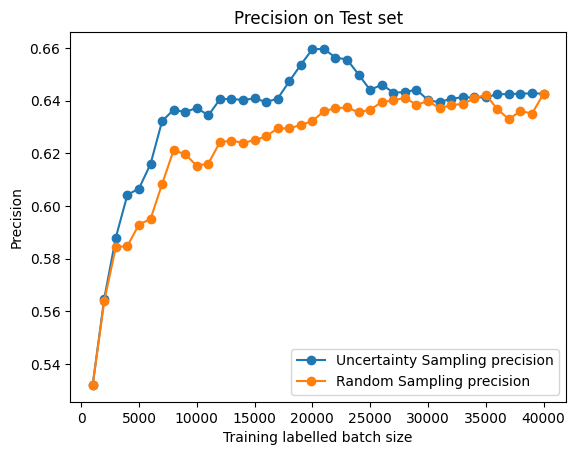

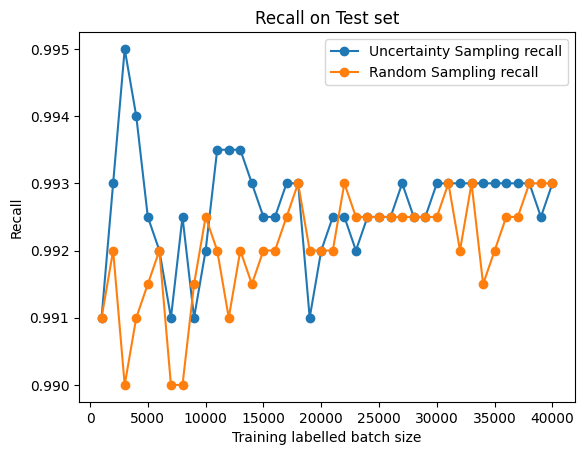

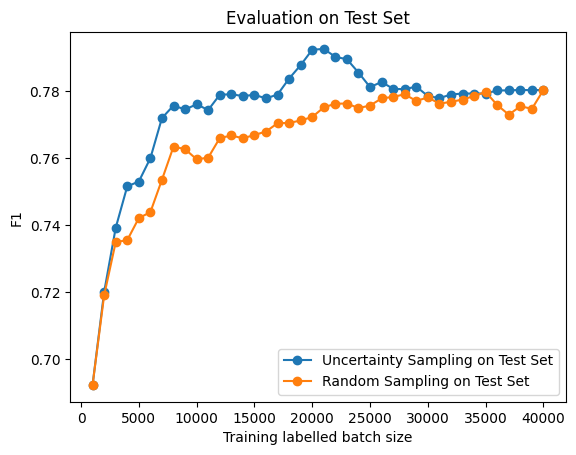

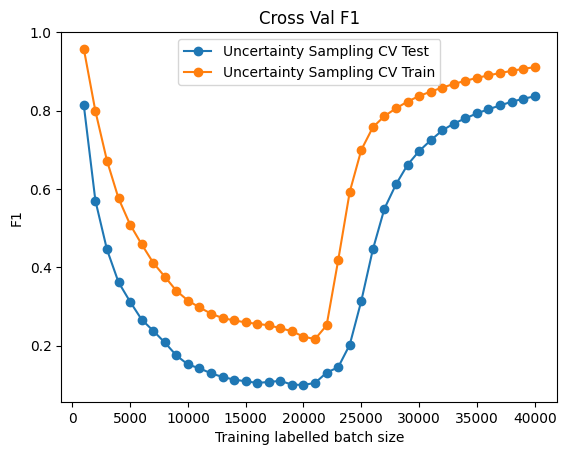

In [20]:
plt.plot(u_batch_sizes, u_test_set_precisions, '-o', label = "Uncertainty Sampling precision")
# #plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(r_batch_sizes, r_test_set_precisions, '-o', label = "Random Sampling precision")
# # plt.plot(u_batch_sizes, [0.85 for i in u_batch_sizes], label = "True F1 on Test") # 这0.85应该是整个训练集全跑的f1score
# #plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("Precision")
plt.xlabel("Training labelled batch size")
plt.title("Precision on Test set")
plt.legend()
plt.show()

plt.plot(u_batch_sizes, u_test_set_recalls, '-o', label = "Uncertainty Sampling recall")
# #plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(r_batch_sizes, r_test_set_recalls, '-o', label = "Random Sampling recall")
# # plt.plot(u_batch_sizes, [0.85 for i in u_batch_sizes], label = "True F1 on Test") # 这0.85应该是整个训练集全跑的f1score
# #plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("Recall")
plt.xlabel("Training labelled batch size")
plt.title("Recall on Test set")
plt.legend()
plt.show()

plt.plot(u_batch_sizes, u_test_set_fs, '-o', label = "Uncertainty Sampling on Test Set")
#plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(r_batch_sizes, r_test_set_fs, '-o', label = "Random Sampling on Test Set")
# plt.plot(u_batch_sizes, [0.85 for i in u_batch_sizes], label = "True F1 on Test")
#plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Evaluation on Test Set")
plt.legend()
plt.show()


plt.plot(u_batch_sizes, u_test_f_scores, '-o', label = "Uncertainty Sampling CV Test")
#plt.plot(r_batch_sizes, r_test_f_scores, '-o', label = "Random Sampling Test")
plt.plot(u_batch_sizes, u_train_f_scores, '-o', label = "Uncertainty Sampling CV Train")
#plt.plot(r_batch_sizes, r_train_f_scores, '-o', label = "Random Sampling Train")
plt.ylabel("F1")
plt.xlabel("Training labelled batch size")
plt.title("Cross Val F1")
plt.legend()
plt.show()
# 当train f1上升，并且test f1下降时，说明模型过拟合了